<a href="https://colab.research.google.com/github/sankichi92/satelliteBook/blob/main/notebooks/4-2-forest.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 4-2 森林分野における衛星データ利用事例

[『Pythonで学ぶ衛星データ解析基礎』](https://gihyo.jp/book/2022/978-4-297-13232-3)第4章 衛星データ解析手法別演習 [解析編] より。

In [1]:
!date --rfc-3339=seconds

2023-01-01 14:52:25+00:00


In [2]:
!python --version

Python 3.8.16


In [3]:
!pip install --upgrade matplotlib>=3.6.2 # To use Constrained layout
!pip install geopandas>=0.12.2 pystac-client>=0.5.1 rioxarray>=0.13.3 stackstac>=0.4.3

In [4]:
%config InlineBackend.figure_formats = ['retina']

In [5]:
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (8, 6)
plt.rcParams['figure.dpi'] = 100

関心領域の市区町村のポリゴンを取得する。

In [6]:
import geopandas as gpd
aoi_code = '08202' # 茨城県日立市
aoi_gdf = gpd.read_file(f'https://shikuchoson-boundaries.sankichi.app/{aoi_code}.geojson')
aoi_gdf

,都道府県,市区町村,行政区域コード,geometry
0,茨城県,日立市,08202,"MULTIPOLYGON (((140.63006 36.47682, 140.62976 ..."


<AxesSubplot: >

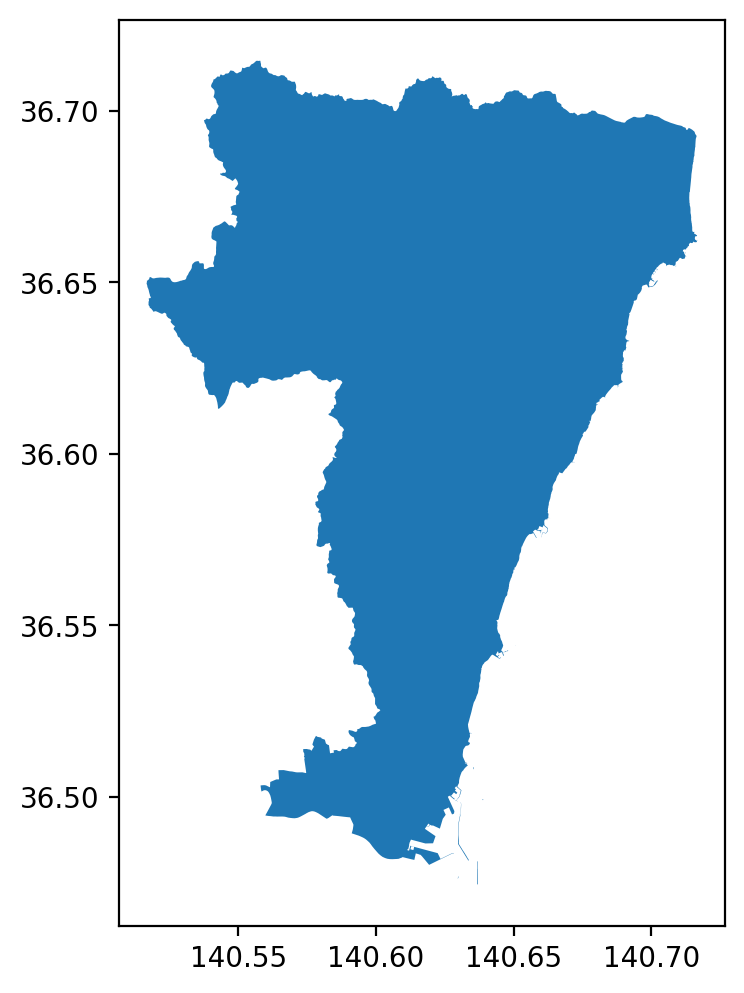

In [7]:
aoi_gdf.plot()

3ヶ月の季節ごとにもっとも被雲率の低い Sentinel 2 のデータを Earth Search から検索する。

In [8]:
from pystac_client import Client
client = Client.open('https://earth-search.aws.element84.com/v0')
client

ID: earth-search
Title: Earth Search
Description: A STAC API of AWS Public Datasets powered by stac-server
stac_api_version: 0.9.0
type: Catalog
ID: sentinel-s2-l2a
Title: Sentinel 2 L2A
"Description: Sentinel-2a and Sentinel-2b imagery, processed to Level 2A (Surface Reflectance)"
Providers: ESA (producer) Sinergise (processor) AWS (host) Element 84 (processor)
stac_extensions: ['https://stac-extensions.github.io/item-assets/v1.0.0/schema.json']
title: Sentinel 2 L2A


In [9]:
import itertools

aoi_items = []
for year, month in itertools.product([2021, 2022], ['01', '04', '07', '10']):
  res = client.search(
    collections='sentinel-s2-l2a-cogs',
    bbox=aoi_gdf.total_bounds,
    datetime=f'{year}-{month}',
    query=['eo:cloud_cover<10', 'sentinel:valid_cloud_cover=true'],
  )
  min_cloud_item = min(res.items(), key=lambda item: item.properties['eo:cloud_cover'])
  aoi_items.append(min_cloud_item)

res_gdf = gpd.GeoDataFrame.from_features([item.to_dict() for item in aoi_items])
res_gdf

,geometry,datetime,platform,constellation,instruments,gsd,view:off_nadir,proj:epsg,sentinel:utm_zone,sentinel:latitude_band,sentinel:grid_square,sentinel:sequence,sentinel:product_id,sentinel:data_coverage,eo:cloud_cover,sentinel:valid_cloud_cover,created,updated,sentinel:processing_baseline,sentinel:boa_offset_applied
0,"POLYGON ((140.29989 36.05469, 140.57900 37.045...",2021-01-14T01:27:08Z,sentinel-2a,sentinel-2,[msi],10,0,32654,54,S,VF,0,S2A_MSIL2A_20210114T012011_N0214_R031_T54SVF_2...,54.59,0.00,True,2021-01-14T09:28:10.769Z,2021-01-14T09:28:10.769Z,NaN,NaN
1,"POLYGON ((139.88933 36.05159, 139.87508 37.041...",2021-04-27T01:37:00Z,sentinel-2a,sentinel-2,[msi],10,0,32654,54,S,VF,0,S2A_MSIL2A_20210427T012651_N0300_R074_T54SVF_2...,100.00,0.02,True,2021-04-27T07:09:35.306Z,2021-04-27T07:09:35.306Z,NaN,NaN
2,"POLYGON ((139.88933 36.05159, 139.87508 37.041...",2021-07-21T01:37:05Z,sentinel-2b,sentinel-2,[msi],10,0,32654,54,S,VF,0,S2B_MSIL2A_20210721T012659_N0301_R074_T54SVF_2...,100.00,8.01,True,2021-07-21T07:10:08.498Z,2021-07-21T07:10:08.498Z,NaN,NaN
3,"POLYGON ((139.88933 36.05159, 139.87508 37.041...",2021-10-24T01:37:09Z,sentinel-2a,sentinel-2,[msi],10,0,32654,54,S,VF,0,S2A_MSIL2A_20211024T012731_N0301_R074_T54SVF_2...,100.00,0.65,True,2021-10-24T07:21:53.712Z,2021-10-24T07:21:53.713Z,NaN,NaN
4,"POLYGON ((140.30811 36.05474, 140.43683 36.513...",2022-01-09T01:27:08Z,sentinel-2a,sentinel-2,[msi],10,0,32654,54,S,VF,0,S2A_MSIL2A_20220109T012031_N0301_R031_T54SVF_2...,53.88,0.05,True,2022-01-09T06:00:06.651Z,2022-01-09T06:00:06.651Z,NaN,NaN
5,"POLYGON ((139.88933 36.05159, 139.87508 37.041...",2022-04-12T01:37:06Z,sentinel-2a,sentinel-2,[msi],10,0,32654,54,S,VF,0,S2A_MSIL2A_20220412T012701_N0400_R074_T54SVF_2...,100.00,0.02,True,2022-04-12T10:01:22.475Z,2022-04-12T10:01:22.476Z,04.00,True
6,"POLYGON ((139.88933 36.05159, 139.87508 37.041...",2022-07-01T01:37:16Z,sentinel-2a,sentinel-2,[msi],10,0,32654,54,S,VF,0,S2A_MSIL2A_20220701T012711_N0400_R074_T54SVF_2...,100.00,0.21,True,2022-07-01T06:18:17.643Z,2022-07-01T06:18:17.643Z,04.00,True
7,"POLYGON ((140.30800 36.05474, 140.58811 37.045...",2022-10-01T01:27:06Z,sentinel-2b,sentinel-2,[msi],10,0,32654,54,S,VF,0,S2B_MSIL2A_20221001T011649_N0400_R031_T54SVF_2...,53.89,0.22,True,2022-10-01T06:08:02.769Z,2022-10-01T06:08:02.769Z,04.00,True


検索結果のサムネイルを表示する。

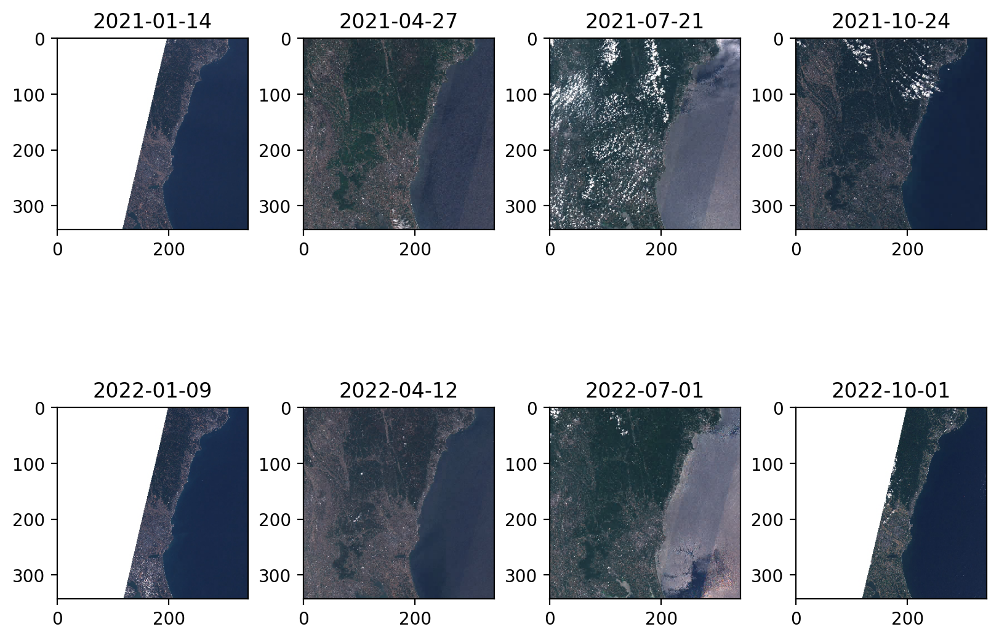

In [10]:
import io
import requests
from PIL import Image

fig, axs = plt.subplots(2, 4, layout='constrained')
for ax, item in zip(axs.flat, aoi_items):
  ax.set_title(item.datetime.strftime('%Y-%m-%d'))
  res = requests.get(item.assets['thumbnail'].href)
  ax.imshow(Image.open(io.BytesIO(res.content)))

[stacstack](https://stackstac.readthedocs.io/en/latest/) で検索結果を xarray.DataArray にし、関心領域でクリップする。

In [11]:
import rioxarray
import stackstac

aoi_stack = stackstac.stack(aoi_items, assets=['B02', 'B03', 'B04', 'B08'])
aoi_stack = aoi_stack.rio.clip(aoi_gdf.geometry.values, crs=aoi_gdf.crs)
aoi_stack

<xarray.DataArray 'stackstac-2e864647e9f48a337409971188195cb6' (time: 8,
                                                                band: 4,
                                                                y: 2666, x: 1787)>
dask.array<getitem, shape=(8, 4, 2666, 1787), dtype=float64, chunksize=(1, 1, 1024, 1024), chunktype=numpy.ndarray>
Coordinates: (12/31)
  * time                          (time) datetime64[ns] 2021-01-14T01:27:08 ....
    id                            (time) <U24 'S2A_54SVF_20210114_0_L2A' ... ...
  * band                          (band) <U3 'B02' 'B03' 'B04' 'B08'
  * x                             (x) float64 4.568e+05 4.568e+05 ... 4.747e+05
  * y                             (y) float64 4.063e+06 4.063e+06 ... 4.037e+06
    sentinel:product_id           (time) <U60 'S2A_MSIL2A_20210114T012011_N02...
    ...                            ...
    proj:transform                object {0, 1, 4100040, 10, -10, 399960}
    common_name                   (band) <U5 'blue' 'green' 'red' 'nir'
    center_wavelength             (band) float64 0.4966 0.56 0.6645 0.8351
    full_width_half_max           (band) float64 0.098 0.045 0.038 0.145
    epsg                          int64 32654
    spatial_ref                   int64 0
Attributes:
    spec:        RasterSpec(epsg=32654, bounds=(399960.0, 3990240.0, 509760.0...
    resolution:  10.0

季節ごとのデータをトゥルーカラー画像として表示する。

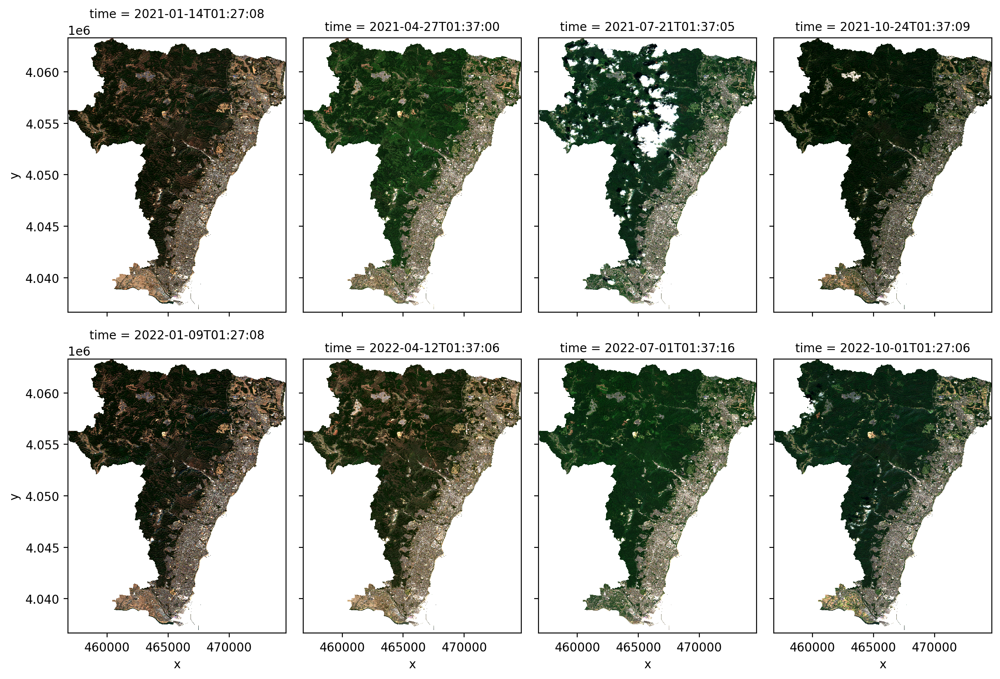

In [12]:
aoi_stack.sel(band=['B04', 'B03', 'B02']).plot.imshow(
    rgb='band',
    col='time',
    col_wrap=4,
    size=4,
    aspect=aoi_stack.coords['x'].size / aoi_stack.coords['y'].size,
    robust=True
)

[国土交通省国土数値情報ダウンロードサイト](https://nlftp.mlit.go.jp/ksj/gml/datalist/KsjTmplt-A13-v3_2.html)より、森林地域データを読み込み、関心領域と重なる部分のみを取り出す。

In [13]:
forest_gdf = gpd.read_file(f'zip+https://nlftp.mlit.go.jp/ksj/gml/data/A13/A13-15/A13-15_{aoi_code[:2]}_GML.zip!a001{aoi_code[:2]}0020160207.shp')
forest_gdf

,OBJECTID,PREFEC_CD,AREA_CD,CTV_NAME,FIS_YEAR,THEMA_NO,LAYER_NO,OBJ_NAME,AREA_SIZE,IOSIDE_DIV,REMARK_STR,ET_ID,ET_Source,Shape_Leng,Shape_Area,geometry
0,1538032,8,0,None,2013,1,7,None,132.3,1,None,0,None,0.008621,1.320477e-06,"POLYGON ((140.14467 35.85670, 140.14469 35.856..."
1,1538033,8,0,None,2013,1,7,None,247.1,1,None,0,None,0.016449,2.465633e-06,"POLYGON ((140.14552 35.86077, 140.14554 35.860..."
2,1538034,8,0,None,2013,1,7,None,139.4,1,None,0,None,0.005353,1.390763e-06,"POLYGON ((140.19364 35.86169, 140.19365 35.861..."
3,1538035,8,0,None,2013,1,7,None,144.8,1,None,0,None,0.008829,1.444852e-06,"POLYGON ((140.16953 35.87022, 140.16955 35.870..."
4,1538036,8,0,None,2013,1,7,None,286.6,1,None,0,None,0.015620,2.860448e-06,"POLYGON ((140.18247 35.87070, 140.18246 35.870..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7660,1545692,8,0,None,2013,1,7,None,2800.4,1,None,0,None,0.057579,2.815756e-05,"POLYGON ((140.25807 36.46242, 140.25810 36.462..."
7661,1545693,8,0,None,2013,1,7,None,0.4,1,None,0,None,0.000564,4.514632e-09,"POLYGON ((140.24439 36.58243, 140.24439 36.582..."
7662,1545694,8,0,None,2013,1,7,None,614423.3,1,None,0,None,2.838400,6.190718e-03,"POLYGON ((140.23295 36.67259, 140.23297 36.672..."
7663,1545695,8,0,None,2013,1,7,None,1562841.8,1,None,0,None,4.824492,1.576091e-02,"POLYGON ((140.27955 36.77875, 140.27958 36.778..."


<AxesSubplot: >

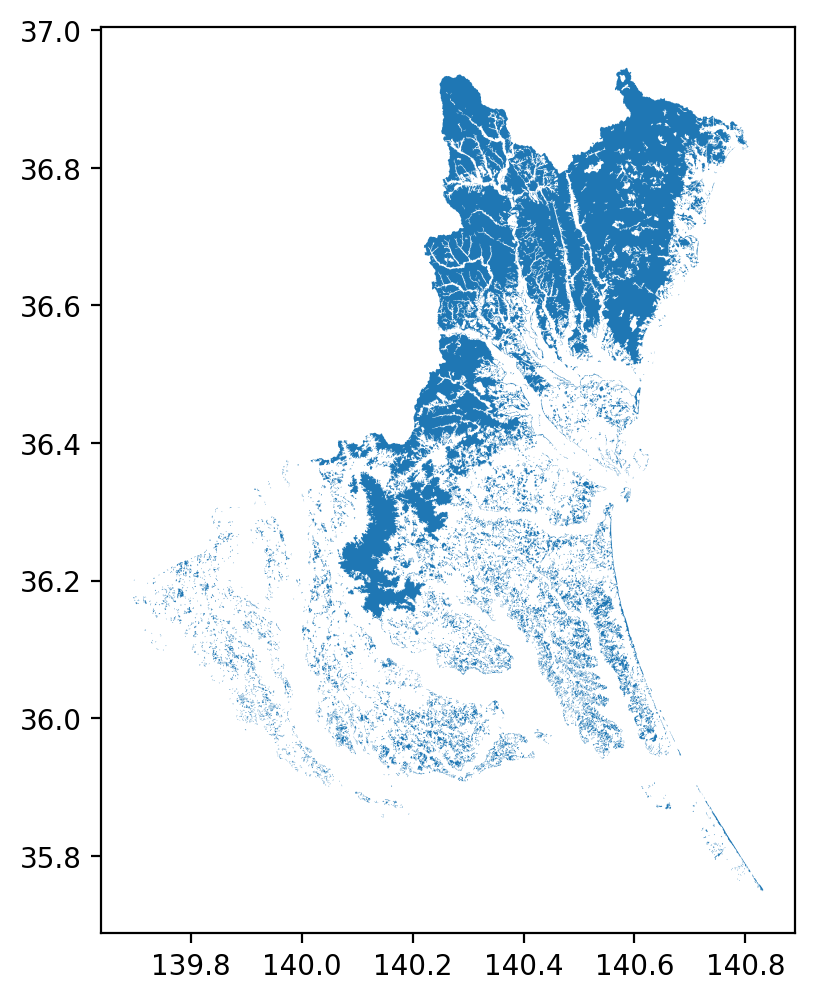

In [14]:
forest_gdf.plot()

<AxesSubplot: >

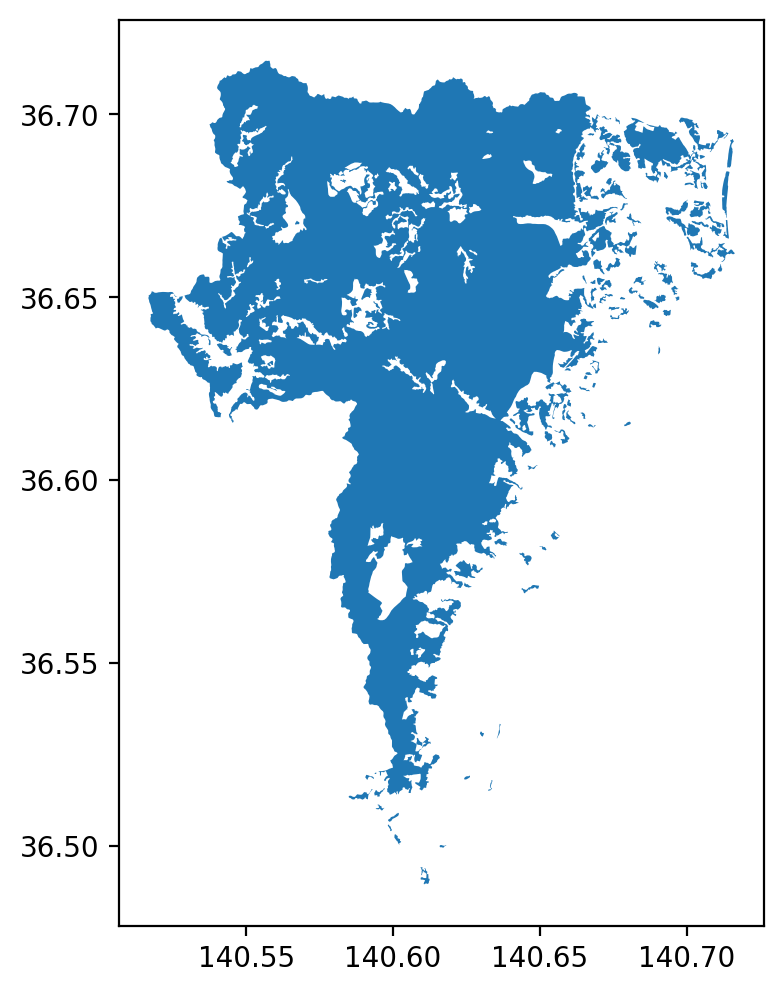

In [15]:
aoi_forest_gdf = forest_gdf.overlay(aoi_gdf.to_crs(forest_gdf.crs), how='intersection')
aoi_forest_gdf.plot()

関心領域の森林地域面積（ha）を計算する。

In [16]:
forest_area = aoi_forest_gdf.to_crs('EPSG:6691').area.sum() / 10_000
forest_area

13515.062789689684

NDVI を計算し、画像表示する。

In [17]:
red, nir = aoi_stack.sel(band='B04'), aoi_stack.sel(band='B08')
aoi_ndvi = (nir - red) / (nir + red)
aoi_ndvi

<xarray.DataArray 'stackstac-2e864647e9f48a337409971188195cb6' (time: 8,
                                                                y: 2666, x: 1787)>
dask.array<truediv, shape=(8, 2666, 1787), dtype=float64, chunksize=(1, 1024, 1024), chunktype=numpy.ndarray>
Coordinates: (12/26)
  * time                          (time) datetime64[ns] 2021-01-14T01:27:08 ....
    id                            (time) <U24 'S2A_54SVF_20210114_0_L2A' ... ...
  * x                             (x) float64 4.568e+05 4.568e+05 ... 4.747e+05
  * y                             (y) float64 4.063e+06 4.063e+06 ... 4.037e+06
    sentinel:product_id           (time) <U60 'S2A_MSIL2A_20210114T012011_N02...
    proj:epsg                     int64 32654
    ...                            ...
    sentinel:boa_offset_applied   (time) object None None None ... True True
    sentinel:processing_baseline  (time) object None None ... '04.00' '04.00'
    proj:shape                    object {10980}
    proj:transform                object {0, 1, 4100040, 10, -10, 399960}
    epsg                          int64 32654
    spatial_ref                   int64 0

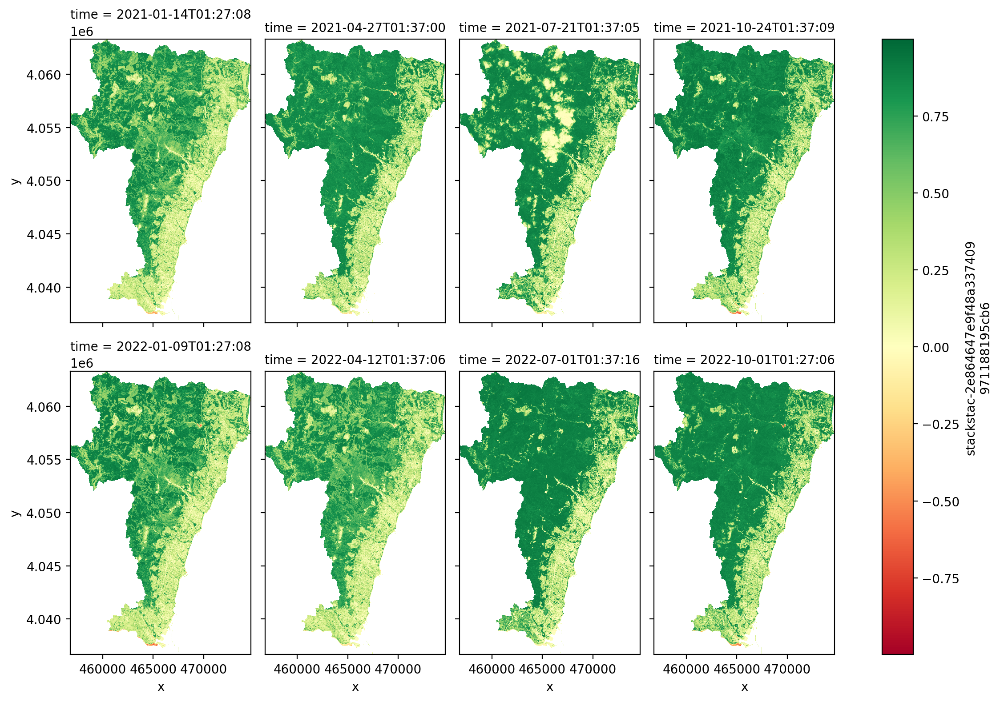

In [18]:
aoi_ndvi.plot(
    col='time',
    col_wrap=4,
    size=4,
    aspect=aoi_ndvi.coords['x'].size / aoi_ndvi.coords['y'].size,
    cmap='RdYlGn'
)

森林領域でクリップし、画像表示する。

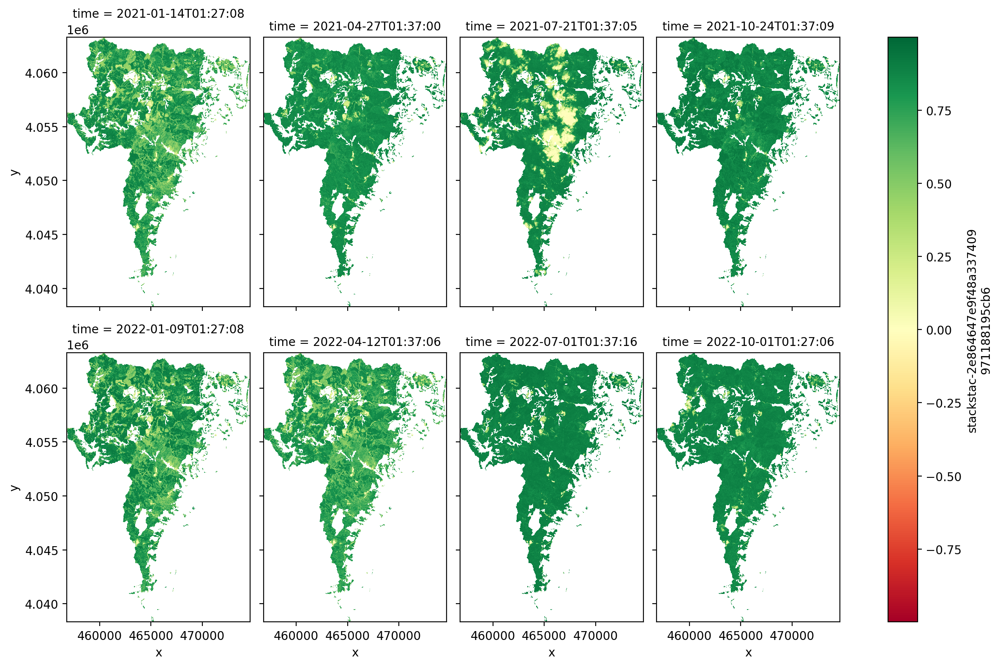

In [19]:
aoi_forest_ndvi = aoi_ndvi.rio.clip(aoi_forest_gdf.geometry.values, crs=aoi_forest_gdf.crs)
aoi_forest_ndvi.plot(
    col='time',
    col_wrap=4,
    size=4,
    aspect=aoi_forest_ndvi.coords['x'].size / aoi_forest_ndvi.coords['y'].size,
    cmap='RdYlGn'
)

各季節の NDVI を正規化し、NDVI と森林面積に相関関係があると仮定して森林面積を推定する。

In [20]:
max = aoi_forest_ndvi.max(dim=('x', 'y'))
min = aoi_forest_ndvi.min(dim=('x', 'y'))
mean = aoi_forest_ndvi.mean(dim=('x', 'y'))

# 2021年の1月を全体の最小値、7月を全体の最大値として正規化する
normalized_ndvi = (mean - min.isel(time=0)) / (max.isel(time=2) - min.isel(time=0))

# 2021年7月の NDVI が国土数値情報から取得した森林面積に一致するとして、森林面積を推定する
estimated_forest_areas = (forest_area * normalized_ndvi / normalized_ndvi.isel(time=2)).compute()
estimated_forest_areas

/usr/local/lib/python3.8/dist-packages/dask/array/reductions.py:569: RuntimeWarning: All-NaN slice encountered
  return np.nanmax(x_chunk, axis=axis, keepdims=keepdims)
/usr/local/lib/python3.8/dist-packages/dask/array/reductions.py:540: RuntimeWarning: All-NaN slice encountered
  return np.nanmin(x_chunk, axis=axis, keepdims=keepdims)


<xarray.DataArray 'stackstac-2e864647e9f48a337409971188195cb6' (time: 8)>
array([13104.02327737, 14238.45710355, 13515.06278969, 14770.35840935,
       13435.29381925, 13092.66636462, 14933.95791799, 14728.11188583])
Coordinates: (12/17)
  * time                          (time) datetime64[ns] 2021-01-14T01:27:08 ....
    proj:epsg                     int64 32654
    constellation                 <U10 'sentinel-2'
    sentinel:grid_square          <U2 'VF'
    instruments                   <U3 'msi'
    sentinel:valid_cloud_cover    bool True
    ...                            ...
    proj:shape                    object {10980}
    proj:transform                object {0, 1, 4100040, 10, -10, 399960}
    epsg                          int64 32654
    spatial_ref                   int64 0
    sentinel:boa_offset_applied   object None
    sentinel:processing_baseline  object None

時系列推移をグラフ化する。

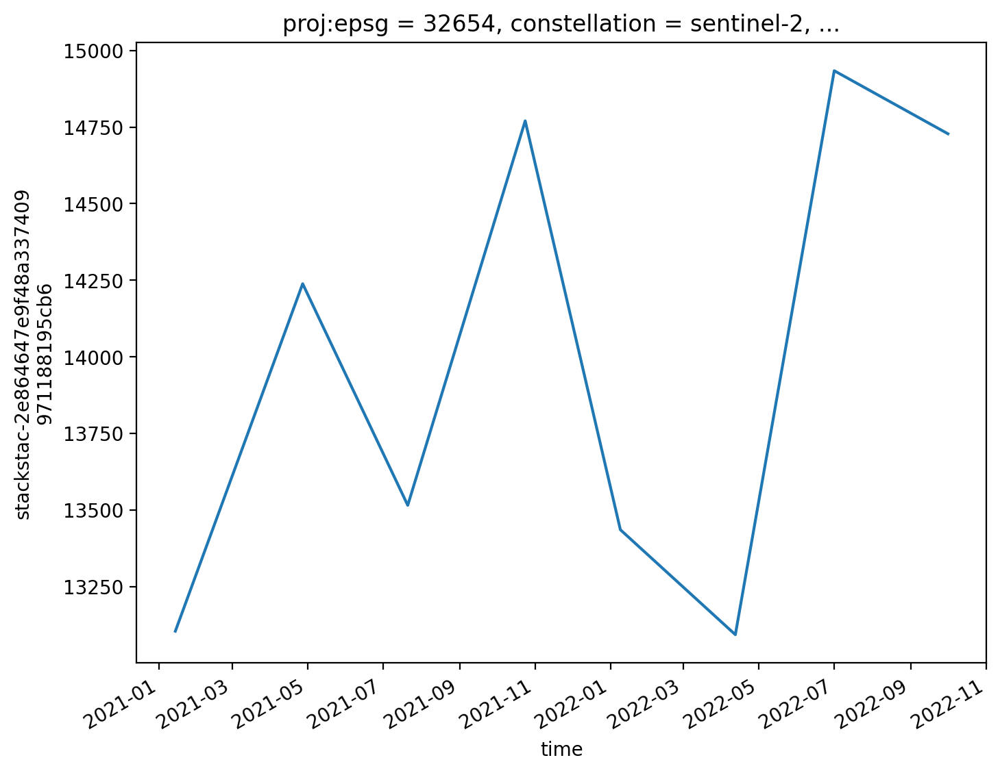

In [21]:
estimated_forest_areas.plot()

2021年10月から2022年10月にかけての NDVI の変化を画像表示する。

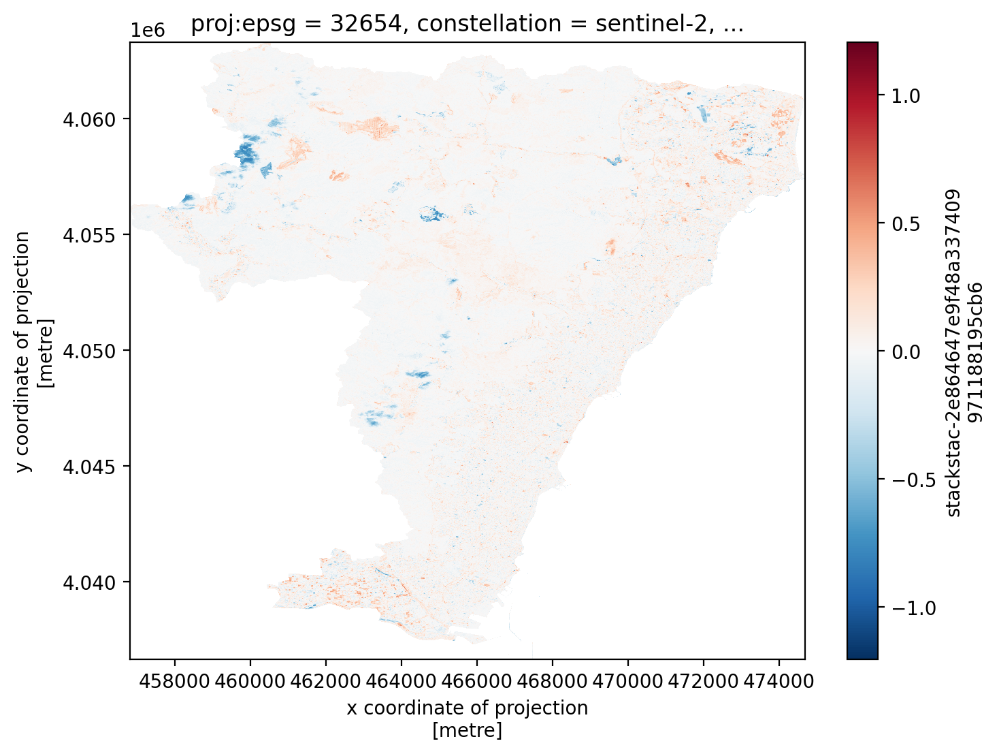

In [22]:
ndvi_diff = aoi_ndvi.isel(time=7) - aoi_ndvi.isel(time=3)
ndvi_diff.plot()